In [1]:
from src.util import load_video
from pathlib import Path
import numpy as np

video = load_video(Path("data/public/videos/2_i_kitchen_bridge_mp.mp4"))


video

[array([[[109,  91,  81],
         [109,  91,  81],
         [109,  91,  81],
         ..., 
         [ 99,  78,  57],
         [ 99,  78,  57],
         [ 98,  77,  56]],
 
        [[109,  91,  81],
         [109,  91,  81],
         [109,  91,  81],
         ..., 
         [100,  79,  58],
         [100,  79,  58],
         [100,  79,  58]],
 
        [[111,  93,  83],
         [111,  93,  83],
         [111,  93,  83],
         ..., 
         [100,  79,  58],
         [100,  79,  58],
         [100,  79,  58]],
 
        ..., 
        [[ 78,  91,  94],
         [ 76,  89,  92],
         [ 75,  85,  89],
         ..., 
         [ 95,  81,  54],
         [100,  86,  59],
         [ 98,  84,  57]],
 
        [[ 83, 101, 103],
         [ 77,  95,  97],
         [ 75,  90,  93],
         ..., 
         [100,  86,  59],
         [ 99,  85,  58],
         [ 93,  79,  52]],
 
        [[ 81,  99, 101],
         [ 76,  94,  96],
         [ 79,  94,  97],
         ..., 
         [ 93,  79,  52

In [2]:
# Sample 10 frames
import numpy as np
import cv2
from skimage.feature import local_binary_pattern
from src.video_dataset import preprocess_frame

# parameters for LBP
LBP_RADIUS = 1
LBP_N_POINTS = 8 * LBP_RADIUS
LBP_METHOD = "uniform"

# pick 10 evenly spaced frames
indices = np.linspace(0, len(video) - 1, 10, dtype=int)
frames = [preprocess_frame(video[i]) for i in indices]

# 1) Optical-flow + temporal variance
# convert all to gray float32
gray_f = [cv2.cvtColor(f, cv2.COLOR_RGB2GRAY).astype(np.float32)/255.0 for f in frames]

# compute Farneback flow magnitudes between each pair
flow_mags = []
for a, b in zip(gray_f[:-1], gray_f[1:]):
    flow = cv2.calcOpticalFlowFarneback(
        prev=a, next=b,
        flow=None,
        pyr_scale=0.5, levels=3, winsize=15,
        iterations=3, poly_n=5, poly_sigma=1.2, flags=0
    ) # type: ignore
    mag, ang = cv2.cartToPolar(flow[...,0], flow[...,1])
    flow_mags.append(mag)

flow_mags = np.stack(flow_mags, axis=0)   # shape (9, H, W)

# temporal variance over the 10 gray frames
stacked = np.stack(gray_f, axis=0)        # shape (10, H, W)
temp_var = np.var(stacked, axis=0)        # shape (H, W)

print("flow_mags:", flow_mags.shape)
print("temp_var:", temp_var.shape)

# 2) LBP + Chroma for each sampled frame
lbps = []
cb_list = []
cr_list = []
for f in frames:
    # 2a) LBP on gray
    gray = cv2.cvtColor(f, cv2.COLOR_RGB2GRAY)
    lbp = local_binary_pattern(gray, LBP_N_POINTS, LBP_RADIUS, method=LBP_METHOD)
    lbps.append(lbp.astype(np.uint8))

    # 2b) Chroma channels
    ycrcb = cv2.cvtColor(f, cv2.COLOR_RGB2YCrCb)
    _, cr, cb = cv2.split(ycrcb)
    cr_list.append(cr)
    cb_list.append(cb)

lbps   = np.stack(lbps, axis=0)   # (10, H, W)
crs    = np.stack(cr_list, axis=0)
cbs    = np.stack(cb_list, axis=0)

print("lbps:", lbps.shape, "CR:", crs.shape, "CB:", cbs.shape)

flow_mags: (9, 720, 1280)
temp_var: (720, 1280)
lbps: (10, 720, 1280) CR: (10, 720, 1280) CB: (10, 720, 1280)


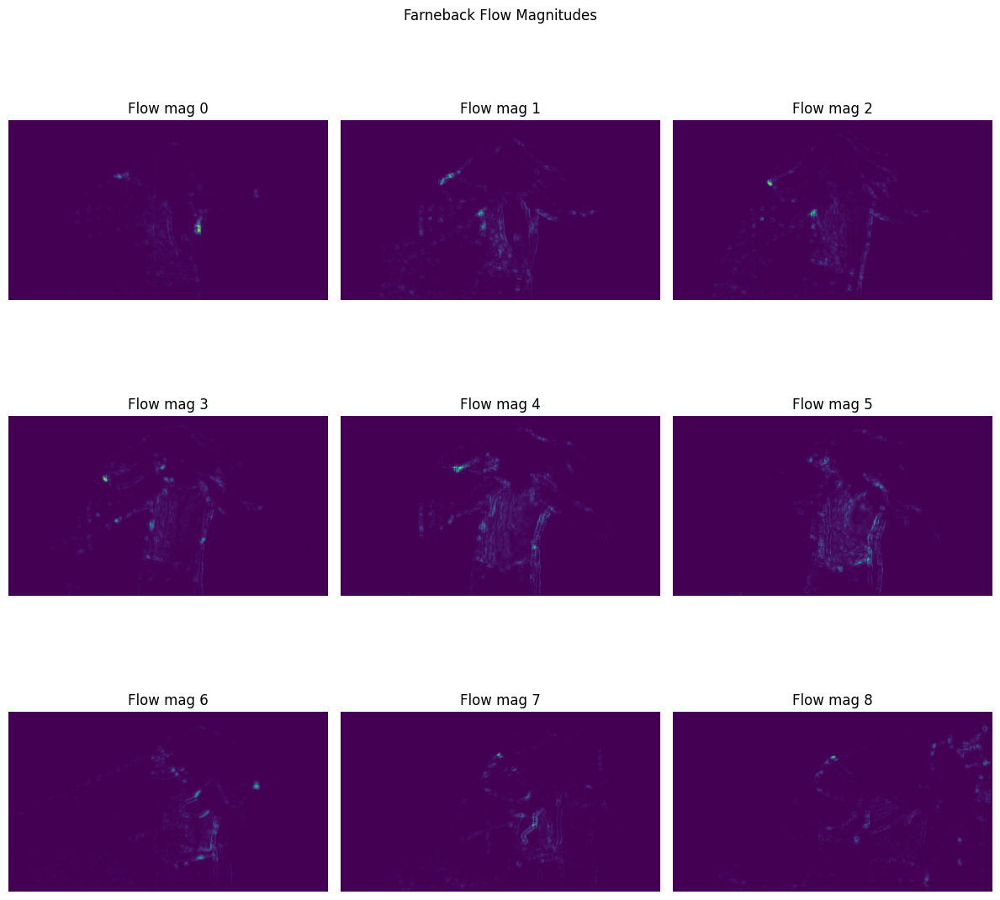

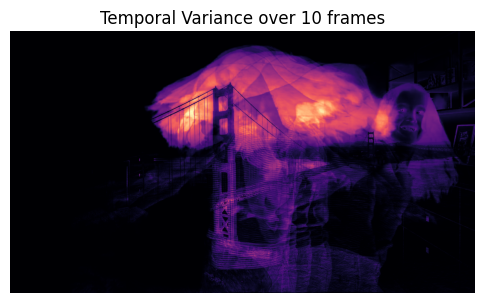

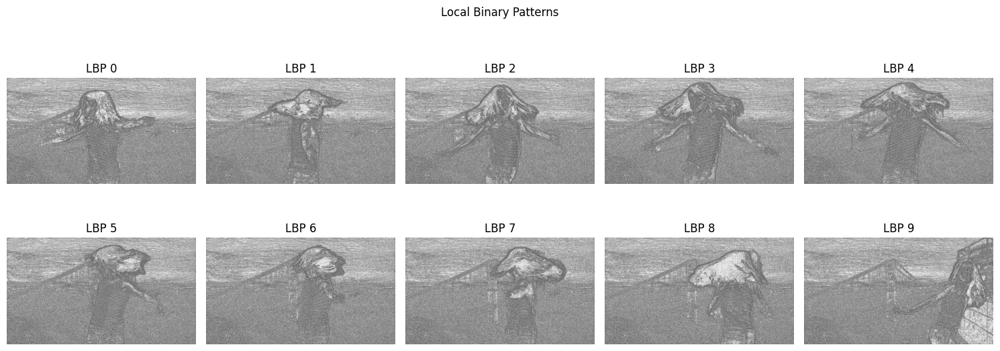

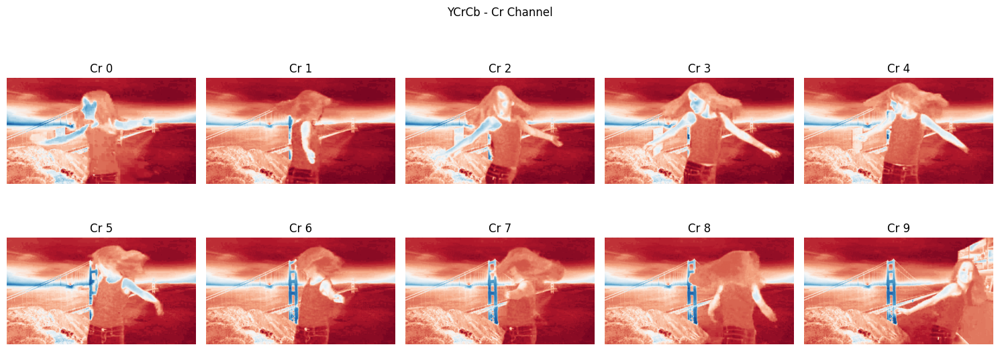

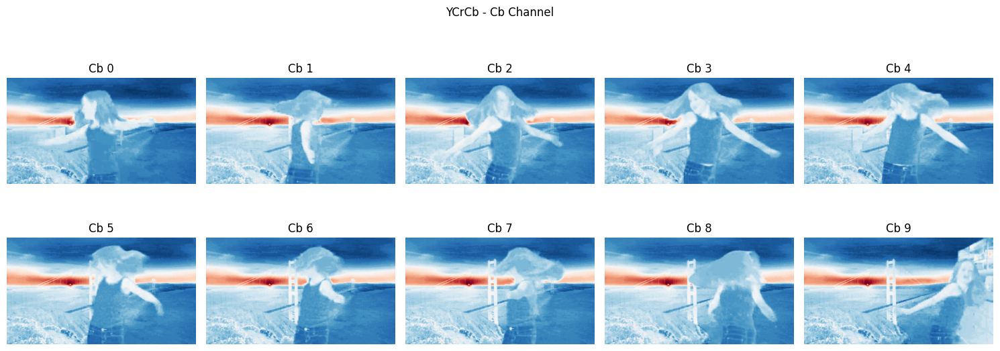

In [3]:
# Visualize optical-flow, temporal variance, LBP and chroma
import matplotlib.pyplot as plt

# 1) Optical‐flow magnitudes (9 maps)
fig, axs = plt.subplots(3, 3, figsize=(12, 12))
for i, ax in enumerate(axs.flat):
    if i < flow_mags.shape[0]:
        im = ax.imshow(flow_mags[i], cmap="viridis")
        ax.set_title(f"Flow mag {i}")
    ax.axis("off")
fig.suptitle("Farneback Flow Magnitudes")
plt.tight_layout()
plt.show()

# 2) Temporal variance
plt.figure(figsize=(6, 6))
plt.imshow(temp_var, cmap="magma")
plt.title("Temporal Variance over 10 frames")
plt.axis("off")
plt.show()

# 3) LBP patterns (10 maps)
fig, axs = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axs.flat):
    ax.imshow(lbps[i], cmap="gray")
    ax.set_title(f"LBP {i}")
    ax.axis("off")
fig.suptitle("Local Binary Patterns")
plt.tight_layout()
plt.show()

# 4) Chroma channels: Cr and Cb
fig, axs = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axs.flat):
    ax.imshow(crs[i], cmap="RdBu")
    ax.set_title(f"Cr {i}")
    ax.axis("off")
fig.suptitle("YCrCb - Cr Channel")
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axs.flat):
    ax.imshow(cbs[i], cmap="RdBu")
    ax.set_title(f"Cb {i}")
    ax.axis("off")
fig.suptitle("YCrCb - Cb Channel")
plt.tight_layout()
plt.show()


combined_masks: (10, 720, 1280)


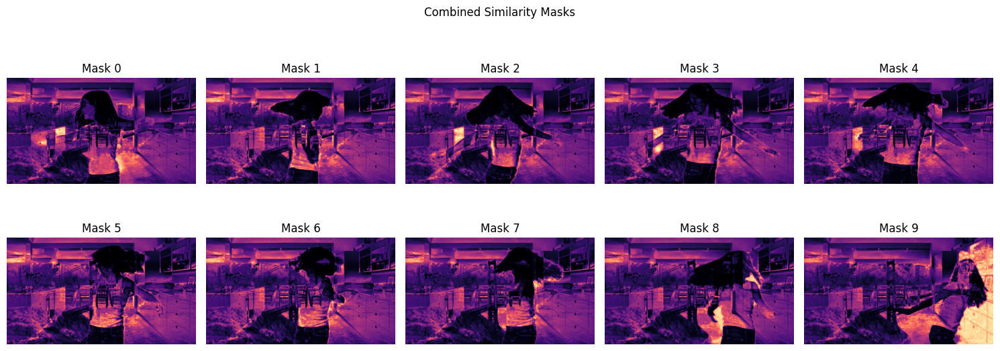

In [4]:
# Compute combined similarity masks for our 10 sampled frames
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
from src.util import load_background
from src.masks import create_continuous_similarity_mask
from src.video_dataset import preprocess_frame

# 1) Load & preprocess the ground-truth background
bg_img = load_background(Path("data/public/backgrounds/kitchen.png"))  # adjust ext if needed
# print(bg_img)
bg_proc = preprocess_frame(bg_img)  # uses your same resize & RGB conversion

# 2) Compute one continuous “combined” mask per frame
combined_masks = []
for f in frames:
    mask = create_continuous_similarity_mask(
        frame=f, 
        ground_truth_bg=bg_proc, 
        method="combined", #"perceptual_distance", 
        threshold=0.0
    )
    combined_masks.append(mask)
combined_masks = np.stack(combined_masks, axis=0)  # shape (10, H, W)
print("combined_masks:", combined_masks.shape)

# 3) Visualize
fig, axs = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axs.flat):
    ax.imshow(combined_masks[i], cmap="magma")
    ax.set_title(f"Mask {i}")
    ax.axis("off")
fig.suptitle("Combined Similarity Masks")
plt.tight_layout()
plt.show()

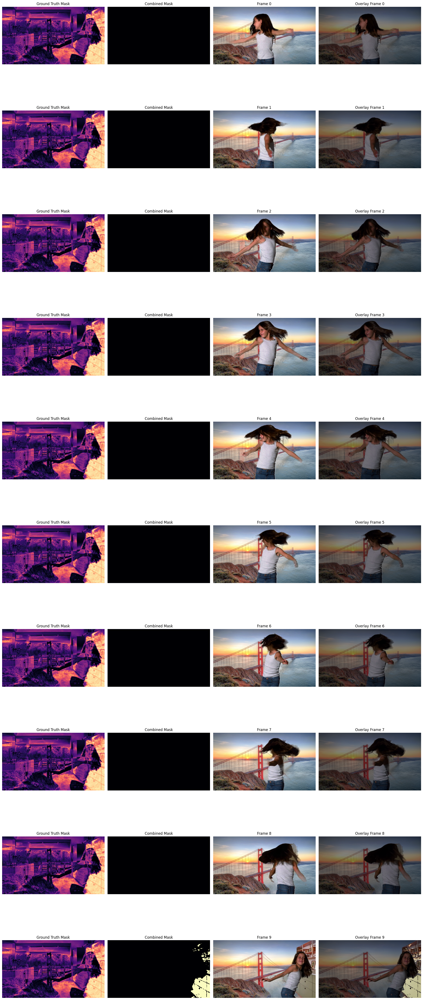

In [5]:
# This cell will plot 4 images in a row for each frame:
# 1) Ground Truth Mask
# 2) Processed combined mask (ground truth * similarity mask with filtering & threshold)
# 3) The original frame
# 4) The overlay of the processed combined mask on the frame

import matplotlib.pyplot as plt
from scipy.ndimage import median_filter
from pathlib import Path
import numpy as np

threshold = 0.75
num_frames = len(frames)

fig, axs = plt.subplots(num_frames, 4, figsize=(20, 5 * num_frames))

for i in range(num_frames):
    # Compute combined mask for the i-th frame
    curr_mask = mask * combined_masks[i]
    # curr_mask = median_filter(curr_mask, size=5)
    curr_mask[curr_mask < threshold] = 0
    curr_mask[curr_mask >= threshold] = 1
    curr_mask = median_filter(curr_mask, size=7)

    # For a single row (if num_frames == 1, axs is 1D) use proper indexing:
    ax0 = axs[i, 0] if num_frames > 1 else axs[0]
    ax1 = axs[i, 1] if num_frames > 1 else axs[1]
    ax2 = axs[i, 2] if num_frames > 1 else axs[2]
    ax3 = axs[i, 3] if num_frames > 1 else axs[3]

    # 1) Ground Truth Mask
    ax0.imshow(mask, cmap="magma")
    ax0.set_title("Ground Truth Mask")
    ax0.axis("off")
    
    # 2) Processed Combined Mask
    ax1.imshow(curr_mask, cmap="magma")
    ax1.set_title("Combined Mask")
    ax1.axis("off")
    
    # 3) Original Frame
    ax2.imshow(frames[i])
    ax2.set_title(f"Frame {i}")
    ax2.axis("off")
    
    # 4) Overlay on Frame
    ax3.imshow(frames[i])
    ax3.imshow(curr_mask, cmap="magma", alpha=0.5)
    ax3.set_title(f"Overlay Frame {i}")
    ax3.axis("off")

plt.tight_layout()
plt.show()

In [1]:
from truesight.features import dog_feature, edge_feature, dog_feature_torch
import numpy as np
from truesight.util import load_video, load_background, show_image
from pathlib import Path
import matplotlib.pyplot as plt
import torch
frames = np.array(load_video(Path("data/public/videos/2_i_kitchen_bridge_mp.mp4")))



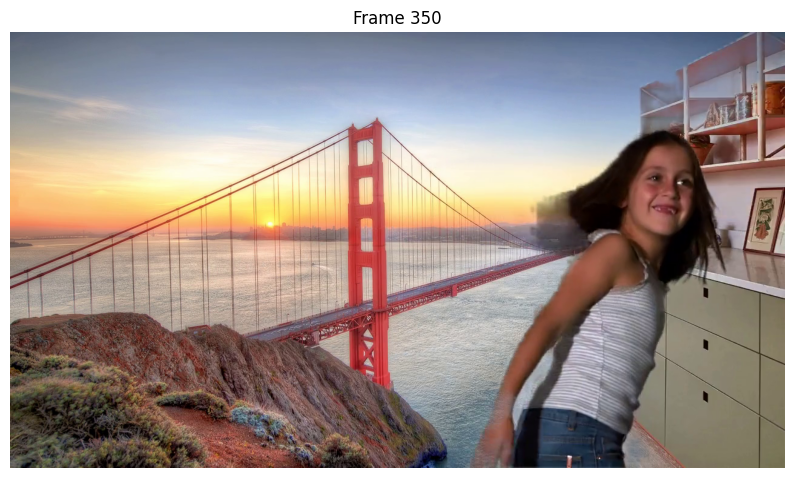

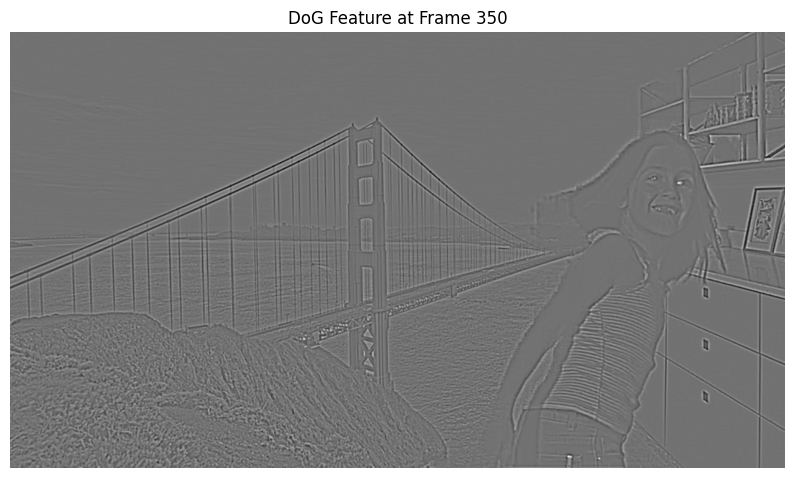

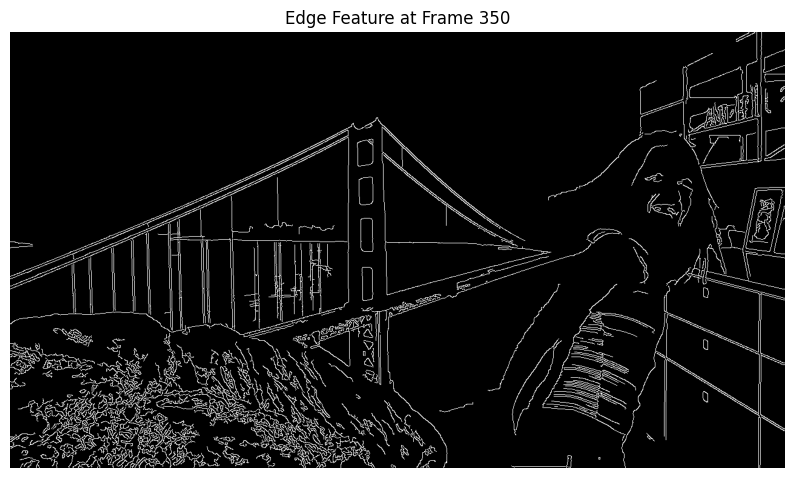

In [4]:
frame_idx = 350
show_image(frames[frame_idx], 
    title=f"Frame {frame_idx}")

dog_frame_x = dog_feature(frames[frame_idx])
show_image(dog_frame_x, 
    title=f"DoG Feature at Frame {frame_idx}")
show_image(edge_feature(frames[frame_idx]),
    title=f"Edge Feature at Frame {frame_idx}")




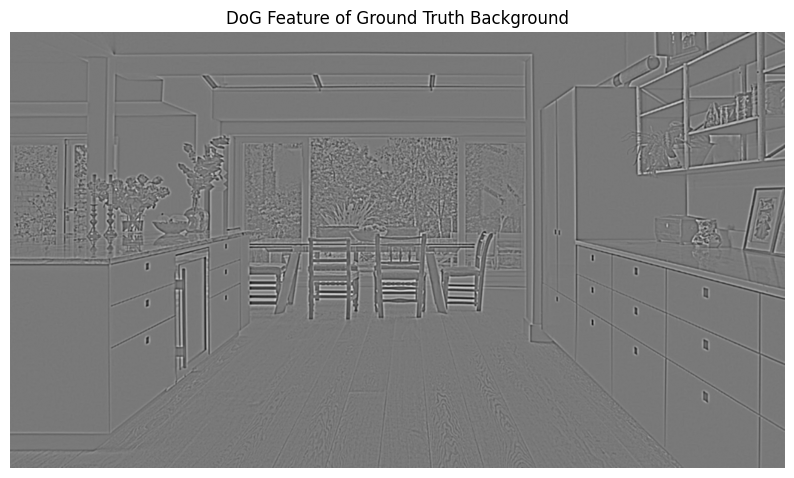

In [6]:
from truesight.util import load_mask


ground_truth = load_background(Path("data/public/backgrounds/kitchen.png"))
mask_ground_truth = load_mask(Path("data/public/masks/2_i_kitchen_mp.png"))
ground_truth_dog = dog_feature(ground_truth)
show_image(ground_truth_dog, title="DoG Feature of Ground Truth Background")



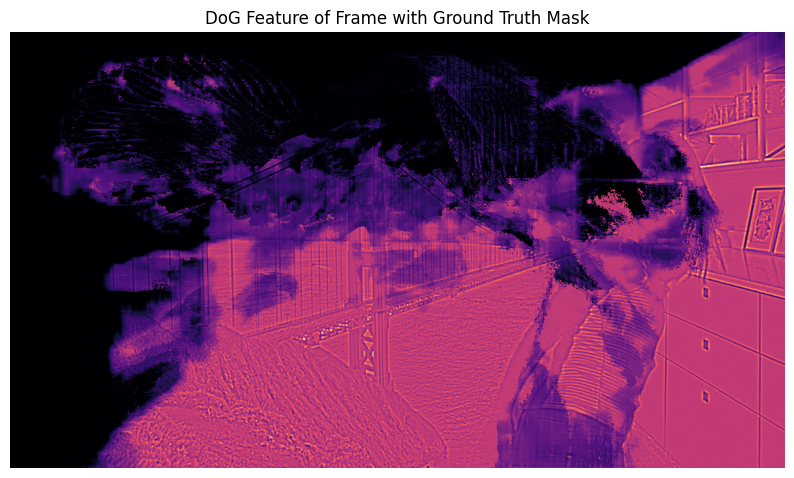

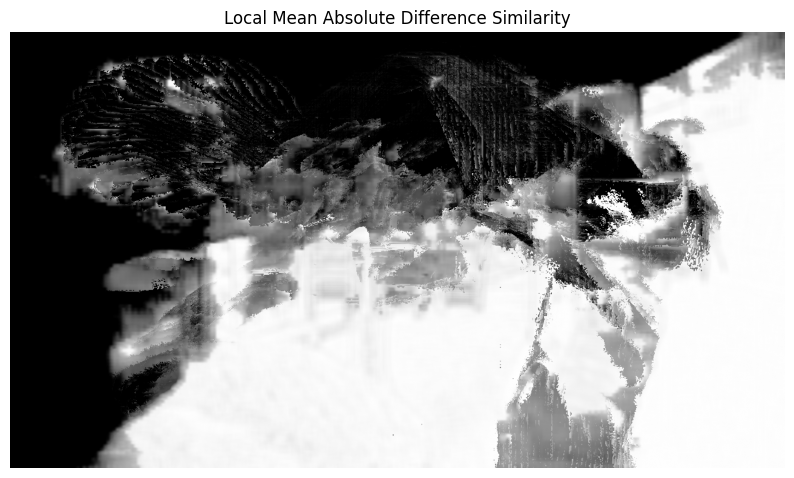

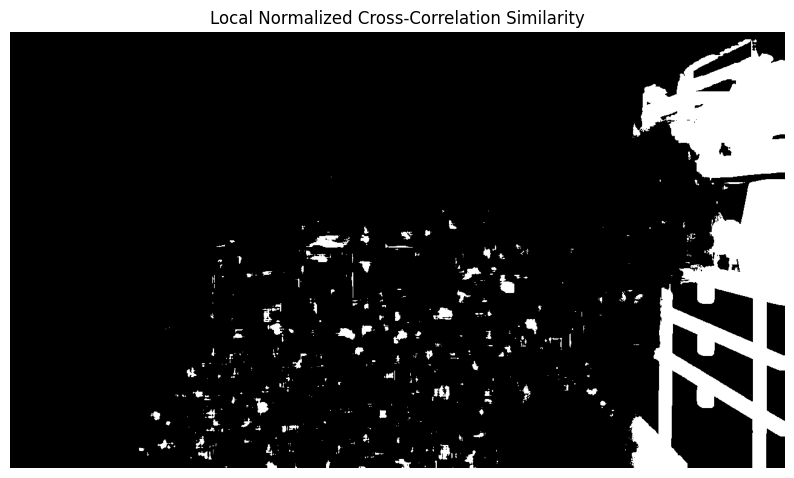

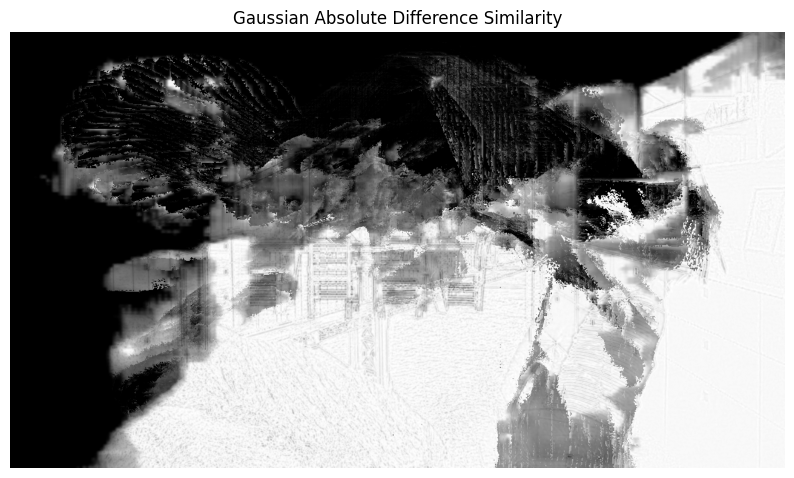

In [24]:
# ground_truth_dog
# dog_frame_x
# mask_ground_truth
import cv2

mask_gt_float = mask_ground_truth.astype(np.float32) / 255.0
dog_frame_x_float = dog_frame_x.astype(np.float32) / 255.0
ground_truth_dog_float = ground_truth_dog.astype(np.float32) / 255.0

masked_frame_x = dog_frame_x_float * mask_gt_float

show_image(masked_frame_x,
    title="DoG Feature of Frame with Ground Truth Mask", cmap="magma")

# calculate the similarity 
def local_mean_abs_diff_similarity(I1, I2, kernel_size=15):
    # 1) pointwise absolute difference
    D = cv2.absdiff(I1, I2)          # same shape, float32
    # 2) smooth with a mean filter
    K = np.ones((kernel_size, kernel_size), np.float32)
    K /= kernel_size**2
    local_diff = cv2.filter2D(D, -1, K)
    # 3) convert to similarity [0..1]
    S = 1.0 - np.clip(local_diff, 0.0, 1.0)
    return S

similarity = local_mean_abs_diff_similarity(
    I1=dog_frame_x_float,
    I2=ground_truth_dog_float,
    kernel_size=15
)
show_image(similarity * mask_gt_float,
    title="Local Mean Absolute Difference Similarity",
)

def local_ncc_similarity(I1, I2, kernel_size=11, eps=1e-8):
    # 1) local means
    mu1 = cv2.blur(I1, (kernel_size, kernel_size))
    mu2 = cv2.blur(I2, (kernel_size, kernel_size))
    # 2) local products & squared
    mu12 = cv2.blur(I1*I2, (kernel_size, kernel_size))
    mu11 = cv2.blur(I1*I1, (kernel_size, kernel_size))
    mu22 = cv2.blur(I2*I2, (kernel_size, kernel_size))
    # 3) numerator / denominator
    num = mu12 - mu1*mu2
    den = np.sqrt((mu11 - mu1*mu1)*(mu22 - mu2*mu2) + eps)
    ncc = num / (den + eps)
    # 4) normalize NCC from [-1..1] to [0..1]
    S = (ncc + 1.0) / 2.0
    return np.clip(S, 0.0, 1.0)

similarity_ncc = local_ncc_similarity(
    I1=dog_frame_x_float,
    I2=ground_truth_dog_float,
    kernel_size=15
)
show_image((similarity_ncc* mask_gt_float)>0.6,
    title="Local Normalized Cross-Correlation Similarity",
)


def gaussian_abs_diff_similarity(I1, I2, ksize=15, sigma=5.0):
    D = cv2.absdiff(I1, I2)
    # cv2.GaussianBlur will normalize kernel internally
    local_diff = cv2.GaussianBlur(D, (ksize, ksize), sigmaX=sigma)
    S = 1.0 - np.clip(local_diff, 0.0, 1.0)
    return S

similarity_gaussian = gaussian_abs_diff_similarity(
    I1=dog_frame_x_float,
    I2=ground_truth_dog_float,
    ksize=5, sigma=0.5
)
show_image(similarity_gaussian * mask_gt_float,
    title="Gaussian Absolute Difference Similarity",
)

In [4]:
import numpy as np
from skimage.metrics import structural_similarity as ssim
from scipy import ndimage
from sklearn.feature_extraction import image
import matplotlib.pyplot as plt

def calculate_ssim_map(image1, image2, window_size=11):
    """Calculate SSIM map for pixel-wise structural similarity"""
    # Ensure images are grayscale
    if image1.ndim == 3:
        image1 = np.mean(image1, axis=2).astype(np.uint8)
    if image2.ndim == 3:
        image2 = np.mean(image2, axis=2).astype(np.uint8)
    
    # Calculate SSIM map
    ssim_map, _ = ssim(image1, image2, full=True, win_size=window_size)
    return ssim_map

def local_binary_pattern_similarity(image1, image2, radius=3, n_points=24):
    """Calculate LBP-based similarity for texture comparison"""
    from skimage.feature import local_binary_pattern
    
    # Convert to grayscale if needed
    if image1.ndim == 3:
        image1 = np.mean(image1, axis=2).astype(np.uint8)
    if image2.ndim == 3:
        image2 = np.mean(image2, axis=2).astype(np.uint8)
    
    # Calculate LBP for both images
    lbp1 = local_binary_pattern(image1, n_points, radius, method='uniform')
    lbp2 = local_binary_pattern(image2, n_points, radius, method='uniform')
    
    # Calculate similarity based on LBP patterns
    lbp_similarity = 1 - np.abs(lbp1 - lbp2) / (n_points + 2)
    return lbp_similarity

def gradient_similarity(image1, image2):
    """Calculate gradient-based similarity"""
    # Convert to grayscale if needed
    if image1.ndim == 3:
        image1 = np.mean(image1, axis=2).astype(np.float32)
    if image2.ndim == 3:
        image2 = np.mean(image2, axis=2).astype(np.float32)
    
    # Calculate gradients
    grad1_x = ndimage.sobel(image1, axis=1)
    grad1_y = ndimage.sobel(image1, axis=0)
    grad2_x = ndimage.sobel(image2, axis=1)
    grad2_y = ndimage.sobel(image2, axis=0)
    
    # Calculate gradient magnitudes
    mag1 = np.sqrt(grad1_x**2 + grad1_y**2)
    mag2 = np.sqrt(grad2_x**2 + grad2_y**2)
    
    # Calculate similarity based on gradient correlation
    numerator = 2 * mag1 * mag2 + 1e-8
    denominator = mag1**2 + mag2**2 + 1e-8
    gradient_sim = numerator / denominator
    
    return gradient_sim

def local_mutual_information(image1, image2, window_size=7):
    """Calculate local mutual information similarity"""
    # Convert to grayscale if needed
    if image1.ndim == 3:
        image1 = np.mean(image1, axis=2).astype(np.uint8)
    if image2.ndim == 3:
        image2 = np.mean(image2, axis=2).astype(np.uint8)
    
    h, w = image1.shape
    mi_map = np.zeros((h, w))
    half_window = window_size // 2
    
    for i in range(half_window, h - half_window):
        for j in range(half_window, w - half_window):
            # Extract local windows
            window1 = image1[i-half_window:i+half_window+1, j-half_window:j+half_window+1]
            window2 = image2[i-half_window:i+half_window+1, j-half_window:j+half_window+1]
            
            # Calculate 2D histogram
            hist_2d, _, _ = np.histogram2d(window1.ravel(), window2.ravel(), bins=16)
            hist_2d = hist_2d + 1e-8  # Avoid log(0)
            
            # Calculate marginal histograms
            hist1 = np.sum(hist_2d, axis=1)
            hist2 = np.sum(hist_2d, axis=0)
            
            # Normalize histograms
            hist_2d = hist_2d / np.sum(hist_2d)
            hist1 = hist1 / np.sum(hist1)
            hist2 = hist2 / np.sum(hist2)
            
            # Calculate mutual information
            mi = 0
            for x in range(16):
                for y in range(16):
                    if hist_2d[x, y] > 0:
                        mi += hist_2d[x, y] * np.log2(hist_2d[x, y] / (hist1[x] * hist2[y]))
            
            mi_map[i, j] = mi
    
    return mi_map

def multi_scale_similarity(image1, image2, scales=[1, 0.5, 0.25]):
    """Calculate multi-scale similarity combining different approaches"""
    from skimage.transform import rescale, resize
    
    # Get original shape for consistent output
    original_shape = image1.shape[:2] if image1.ndim == 3 else image1.shape
    similarity_maps = []
    
    for scale in scales:
        # Rescale images
        if scale != 1:
            img1_scaled = rescale(image1, scale, anti_aliasing=True, 
                                channel_axis=-1 if image1.ndim == 3 else None)
            img2_scaled = rescale(image2, scale, anti_aliasing=True, 
                                channel_axis=-1 if image2.ndim == 3 else None)
        else:
            img1_scaled = image1
            img2_scaled = image2
        
        # Calculate SSIM at this scale
        ssim_map = calculate_ssim_map(img1_scaled, img2_scaled)
        
        # Always resize back to original size for consistent shape
        if ssim_map.shape != original_shape:
            ssim_map = resize(ssim_map, original_shape, anti_aliasing=True)
        
        similarity_maps.append(ssim_map)
    
    # Convert to numpy array and combine multi-scale similarities
    similarity_maps = np.array(similarity_maps)
    combined_similarity = np.mean(similarity_maps, axis=0)
    return combined_similarity

def comprehensive_similarity_analysis(image1, image2):
    """Comprehensive similarity analysis combining multiple methods"""
    results = {}
    
    # SSIM-based similarity
    results['ssim'] = calculate_ssim_map(image1, image2)
    
    # Gradient-based similarity
    results['gradient'] = gradient_similarity(image1, image2)
    
    # Multi-scale similarity
    results['multiscale'] = multi_scale_similarity(image1, image2)
    
    # Local mutual information (computationally intensive)
    results['mutual_info'] = local_mutual_information(image1, image2, window_size=5)
    
    # Find the common shape - all similarity maps should be 2D
    # Use the SSIM result as reference since it's most reliable
    reference_shape = results['ssim'].shape
    
    # Ensure all results have the same 2D shape
    for key in results:
        if results[key].shape != reference_shape:
            from skimage.transform import resize
            # Only resize if it's a 2D array
            if results[key].ndim == 2:
                results[key] = resize(results[key], reference_shape, anti_aliasing=True)
            else:
                # If somehow we got a 3D array, take the first channel or convert to 2D
                if results[key].ndim == 3:
                    results[key] = np.mean(results[key], axis=2)
                results[key] = resize(results[key], reference_shape, anti_aliasing=True)
    
    # Combined weighted similarity
    weights = {'ssim': 0.4, 'gradient': 0.3, 'multiscale': 0.2, 'mutual_info': 0.1}
    
    # Initialize combined with the correct 2D shape
    combined = np.zeros(reference_shape, dtype=np.float64)
    
    for method, weight in weights.items():
        sim_map = results[method]
        
        # Normalize each similarity map to [0, 1]
        sim_min = sim_map.min()
        sim_max = sim_map.max()
        if sim_max - sim_min > 1e-8:  # Avoid division by zero
            sim_normalized = (sim_map - sim_min) / (sim_max - sim_min)
        else:
            sim_normalized = np.zeros_like(sim_map)
        
        # Add to combined result
        combined = combined + weight * sim_normalized
    
    results['combined'] = combined
    
    return results


def visualize_similarity_results(results, titles=None):
    """Visualize similarity results"""
    n_results = len(results)
    fig, axes = plt.subplots(2, (n_results + 1) // 2, figsize=(15, 8))
    axes = axes.flatten() if n_results > 1 else [axes]
    
    if titles is None:
        titles = list(results.keys())
    
    for i, (key, similarity_map) in enumerate(results.items()):
        im = axes[i].imshow(similarity_map, cmap='viridis', vmin=0, vmax=1)
        axes[i].set_title(f'{titles[i] if i < len(titles) else key} Similarity')
        axes[i].axis('off')
        plt.colorbar(im, ax=axes[i])
    
    # Hide unused subplots
    for i in range(n_results, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# if __name__ == "__main__":
#     # Create example images or load your actual images
#     # image1 = np.array(...)  # Your first image
#     # image2 = np.array(...)  # Your second image
    
#     # Run comprehensive analysis
#     # results = comprehensive_similarity_analysis(image1, image2)
    
#     # Visualize results
#     # visualize_similarity_results(results)
    
#     print("Implementation ready! Load your images and run comprehensive_similarity_analysis()")


In [5]:
print(f"Shapes: {frames[frame_idx].shape}, {ground_truth.shape}")

Shapes: (720, 1280, 3), (720, 1280, 3)


In [6]:
# ground_truth
# frames[frame_idx]
# results = comprehensive_similarity_analysis(ground_truth, frames[frame_idx])
# visualize_similarity_results(results, titles=["SSIM", "Gradient", "Multi-Scale", "Mutual Info", "Combined"])


In [5]:
# ssim_map = calculate_ssim_map(ground_truth, frames[frame_idx])
# print(ssim_map)

img1 = dog_feature(ground_truth)
img2 = dog_feature(frames[frame_idx])

lbps_img = local_binary_pattern_similarity(img1, img2)
print("LBP Similarity Map:", lbps_img.shape)
show_image(lbps_img, title="LBP Similarity Map", cmap='magma')

gs_img = gradient_similarity(img1, img2)
print("Gradient Similarity Map:", gs_img.shape)
show_image(gs_img * (gs_img > 0.9), title="Gradient Similarity Map", cmap='magma')
# gs_img

# lmi_img = local_mutual_information(img1, img2, window_size=7)
print("Local Mutual Information Map:", lmi_img.shape)
show_image(lmi_img, title="Local Mutual Information Map", cmap='magma')
# mss_img = multi_scale_similarity(img1, img2, scales=[1, 0.5, 0.25])
# print("Multi-Scale Similarity Map:", mss_img.shape)
# show_image(mss_img, title="Multi-Scale Similarity Map", cmap='magma')


from truesight.features import mode_feature
mode_img = mode_feature(frames)
print("Mode Feature Map:", mode_img.shape)
show_image(mode_img, title="Mode Feature Map", cmap='magma')

dog_mode = dog_feature(mode_img.numpy())
print("DoG Feature of Mode Image:", dog_mode.shape)
show_image(dog_mode, title="DoG Feature of Mode Image")



NameError: name 'ground_truth' is not defined

In [25]:
x = gs_img > 0.5
x.shape
gs_img[x].shape

(625007,)